#

In [1]:
%matplotlib inline 
import csv
import datetime
import fnmatch
import glob
import itertools
from itertools import groupby
import math
import matplotlib.cbook
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from numpy.polynomial.polynomial import polyfit
import os
import pandas as pd
import pickle
import platform
from pylab import rcParams
import re
import scipy
from scipy import stats
from scipy.signal import find_peaks
import statistics
import warnings
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

# Define #ROOT

In [2]:
notebookPath=os.path.dirname(os.path.realpath("__file__"))

#### DEFINE ROOT
#folder with data 
if platform.system()=='Linux':
    root="/home/david/Desktop/DATATEST/20210212"
    #root="/home/david/Desktop/DATARUN_ANALYSIS/test0727"#new/test1203"#DATARUN ANALYSIS/all distance" #all distances" #DATARUN ANALYSIS/test0820
    savePath="/home/david/Desktop/Save"
else:
    #mac = 'Darwin'.    20210106test
    root="/Users/tom/Downloads/DATATEST/20210211"#AET-2/test1203"#Desktop/DATARUN_ANALYSIS/test0826"#" #current : test0826
    savePath="/Users/tom/Desktop/Save"#os.path.join(root,"ALLRATS","Fig")
print("Root: ", root)

retval = os.getcwd()
print("Current working directory: %s" % retval)#print("Notebook Path: ", notebookPath)
print("Save Path: ", savePath)   
print("Path to data is: %s"%root)
print("")
print("importing done")

Root:  /home/david/Desktop/DATATEST/20210212
Current working directory: /home/david/Desktop/code
Save Path:  /home/david/Desktop/Save
Path to data is: /home/david/Desktop/DATATEST/20210212

importing done


In [3]:
#function to open and read from the .position files using pandas, specify the path of the file to open, the column that you want to extract from, and the extension of the file
def read_csv_pandas(path,Col=None,header=None):
    #verify that the file exists
    if not os.path.exists(path):
        print("No file %s"%path)
        return []
    try:
        #open the file
        csvData=pd.read_csv(path,header=header,delim_whitespace=True)
    except ValueError:
        print("%s not valid (usually empty)"%path)
        return []
        #verify that the column that we specified is not empty, and return the values
    if Col is not None:
        return csvData.values[:, Col[0]]
    else:
        return csvData

In [4]:
framebuffer = {}

#create the list of the animals and sessions
animalindex=1
animalList = [os.path.basename(path) for path in sorted(glob.glob(root+"/Rat*"))]
for animal in animalList:
    print("Animal %s"%animal)
    print("%s out of %s" %(animalindex,len(animalList)))
    print("**********")
    animalindex += 1
    #Get the list of all session
    sessionList=[os.path.basename(expPath) for expPath in glob.glob(root+os.sep+animal+os.sep+"Experiments"+os.sep+"Rat*")]
    sessionList=sorted(sessionList)
    nbSession=len(sessionList)
    
    #loop through animals and sessions
    for index, session in enumerate(sessionList):
        print("Session %s/%s: %s"%(index+1,nbSession,session), "['" +animal+ "\',\'" +session + "\']")
        framebuffer[animal, session]      = read_csv_pandas((root+os.sep+animal+os.sep+"Experiments"+os.sep + session + os.sep+session+".position"),Col=[10])

        print(animal, "Data loaded")
        print()   
#clear_output()

Animal RatF02
1 out of 2
**********
Session 1/1: RatF02_2021_02_12_12_52_30 ['RatF02','RatF02_2021_02_12_12_52_30']
RatF02 Data loaded

Animal RatF03
2 out of 2
**********
Session 1/1: RatF03_2021_02_12_13_55_16 ['RatF03','RatF03_2021_02_12_13_55_16']
RatF03 Data loaded



RatF02
[1 1 1 ... 1 1 1]
421 // 91397

RatF03
[1 1 1 ... 1 1 1]
458 // 89604



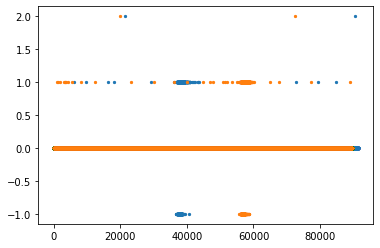

In [5]:

for animal in animalList:
    sessionList=[os.path.basename(expPath) for expPath in glob.glob(root+os.sep+animal+os.sep+"Experiments"+os.sep+"Rat*")]
    for session in sessionList: 
        plt.gca()
        print(animal)
        print(np.diff(framebuffer[animal, session]))
        a = sum(np.diff(framebuffer[animal, session])-1)
        print(a, "//", len(framebuffer[animal, session]))
        #print([i + framebuffer[animal, session][0] for i, e in enumerate(np.diff(framebuffer[animal, session])) if e == 0])
        #print([i + framebuffer[animal, session][0] for i, e in enumerate(np.diff(framebuffer[animal, session])) if e != 1])
        #print([e for i, e in enumerate(np.diff(framebuffer[animal, session])) if e != 1])
        print()
    plt.scatter(list(range(1, len(framebuffer[animal, session]))), [ x-1 for x in np.diff(framebuffer[animal, session])], s=5)